<a href="https://colab.research.google.com/github/datpham18903/Stanford_Dog_Classification/blob/main/Stanford_Dog_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'stanford-dogs-dataset:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F119698%2F791828%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240607%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240607T045606Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D398d5d4dc7afa0a24be7dd9e39b3588cab2c6a1e8692a1e1a7ebd619ae79833634176b98a68ab519384122e696443eeef992f329132454c351e564a3fae4fdf499d623dca46d62c665a7b57e5fddc3733c0bb6067ec144f85983bfc23b49ce14cfbc807197ba2cc6fe697ff9be79f87df96c9985e68d680dbc0e07ee4f407321c41ec3710420d05d2a06592259252f02f507bd4b64ec9165c0688697120de9f185ae50e852cd749560e58c7e3b131335bf268f54e5dff071850c51d6d8266f9def2f8234d1a52399a93cb9a18026f6e2a52c5590172cce23e6e642a8e9d17fdfe8af790154cf246a75088adf91aa07f9b45502f9ed0e48b4dc7da690dd2e704c'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


# Setup

In [ ]:
pip uninstall tensorflow tensorflow-gpu keras -y

Found existing installation: tensorflow 2.15.0
Uninstalling tensorflow-2.15.0:
  Successfully uninstalled tensorflow-2.15.0
Found existing installation: keras 3.3.3
Uninstalling keras-3.3.3:
  Successfully uninstalled keras-3.3.3
Note: you may need to restart the kernel to use updated packages.


In [ ]:
!pip install tensorflow==2.15.0
!pip install keras==2.15.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 60.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.


In [ ]:
!pip install wurlitzer

In [ ]:
!pip install tensorflow-addons

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 10.2 MB/s eta 0:00:0000:01
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.1.5
    Uninstalling typeguard-4.1.5:
      Successfully uninstalled typeguard-4.1.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydata-profiling 4.6.4 requires numpy<1.26,>=1.16.0, but you have numpy 1.26.4 which is incompatible.
ydata-profiling 4.6.4 requires typeguard<5,>=4.1.2, but you have typeguard 2.13.3 which is incompatible.


In [ ]:
# Imports
import os  # Provides functions for interacting with the operating system
import sys  # Provides access to some variables used or maintained by the Python interpreter and to functions that interact strongly with the interpreter
import numpy as np  # Fundamental package for array computing with Python
import seaborn as sns
import random
import pandas as pd  # Provides high-performance, easy-to-use data structures and data analysis tools
import cv2  # OpenCV library for computer vision tasks
import time  # Provides various time-related functions
import json  # Used for working with JSON data
from IPython.core.display import HTML  # Used for displaying HTML in Jupyter notebook

# For plotting and visualization
from matplotlib import pyplot as plt
import matplotlib.ticker as mticker
%matplotlib inline

# TensorFlow and Keras imports for deep learning
import tensorflow as tf
import keras
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import layers
from tensorflow.keras import activations
from tensorflow.keras import optimizers
from tensorflow.keras import losses
from tensorflow.keras import initializers
from tensorflow.keras import regularizers
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, Callback

# Import pretrained models from Keras
from tensorflow.keras.applications import VGG19, ResNet152V2, InceptionResNetV2, DenseNet201

# Scikit-learn imports for machine learning
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay

# Other imports
import xml.etree.ElementTree as ET  # For parsing XML
from PIL import Image  # To read images
import tensorflow_datasets as tfds  # TensorFlow Datasets provides many public datasets as tf.data.Datasets
import tensorflow_addons as tfa  # TensorFlow Addons is a repository of contributions that conform to well-established API patterns, but implement new functionality not available in core TensorFlow

2024-06-07 03:54:29.220665: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-07 03:54:29.220726: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-07 03:54:29.222196: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our Tens

# Data Preprocessing

## **Explore the dataset**

In [ ]:
# Define the paths to the annotation and image directories
annotation_dir = '/kaggle/input/stanford-dogs-dataset/annotations/Annotation/'
image_dir = '/kaggle/input/stanford-dogs-dataset/images/Images/'

# Get a list of all breeds
breed_list = os.listdir(annotation_dir)
# Sort the breed list in alphabetical order
breed_list.sort()

# Create dictionaries for all breeds
label2index_all = {name: index for index, name in enumerate(breed_list)}
index2label_all = {index: name for index, name in enumerate(breed_list)}

images_all = []
annotations_all = []

# Loop over the breed list
for breed in breed_list:
    # Get a list of all image files for the current breed
    image_files = os.listdir(image_dir + breed)
    # Sort the image files in alphabetical order
    image_files.sort()
    # Extract the breed name without the numerical prefix
    breed_name = breed.split('-')[-1]
    # Extend the images list with the updated paths to the image files
    images_all.extend([os.path.join(image_dir, breed_name, f) for f in image_files])
    # Extend the annotations list with the breed names
    annotations_all.extend([breed_name] * len(image_files))

# Convert the lists of images and annotations to numpy arrays
X_all = np.asarray(images_all)
Y_all = np.asarray(annotations_all)

In [ ]:
num_classes = len(breed_list)
print(f"Number of classes: {num_classes}")

Number of classes: 120


In [ ]:
num_images = len(X_all)
print(f"Number of images: {num_images}")

Number of images: 20580


In [ ]:
# Choose a random breed
breed = np.random.choice(breed_list)

# Choose a random image from the chosen breed
dog = np.random.choice(os.listdir(annotation_dir + breed))

# Open the image file
img = Image.open(image_dir + breed + '/' + dog + '.jpg')

# Determine the mode of the image
mode = img.mode
if mode == "1":
    num_channels = 1
    print("The image has 1 channel: (binary).")
elif mode == "L":
    num_channels = 1
    print("The image has 1 channel: (grayscale).")
elif mode == "RGB":
    num_channels = 3
    print("The image has 3 channels: (red, green, blue).")
elif mode == "RGBA":
    num_channels = 4
    print("The image has 4 channels: (red, green, blue, alpha).")
else:
    print(f"The image has a different mode: {mode}")

The image has 3 channels: (red, green, blue).


## **Visualize the data**

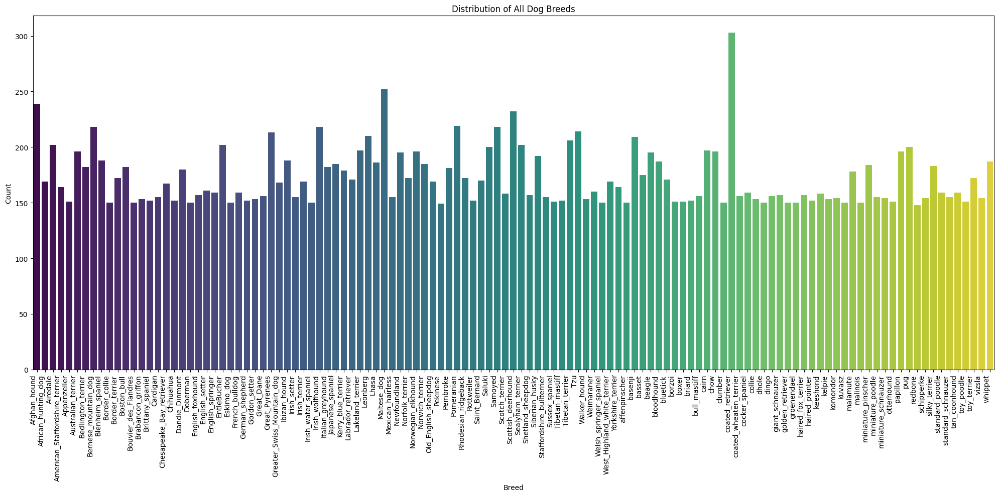

In [ ]:
# Plot the distribution of all breeds
unique_labels_all, label_counts_all = np.unique(Y_all, return_counts=True)
plt.figure(figsize=(20, 10))
sns.barplot(x=unique_labels_all, y=label_counts_all, palette='viridis')
plt.title('Distribution of All Dog Breeds')
plt.xlabel('Breed')
plt.ylabel('Count')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
# Randomly select 12 breeds from the breed list
random_breeds = random.sample(breed_list, 12)

# Create dictionaries for selected breeds
label2index = {name: index for index, name in enumerate(random_breeds)}
index2label = {index: name for index, name in enumerate(random_breeds)}

images = []
annotations = []

# Loop over the selected breed list
for breed in random_breeds:
    # Get a list of all image files for the current breed
    image_files = os.listdir(image_dir + breed)
    # Sort the image files in alphabetical order
    image_files.sort()
    # Extract the breed name without the numerical prefix
    breed_name = breed.split('-')[-1]
    # Extend the images list with the updated paths to the image files
    images.extend([os.path.join(image_dir, breed_name, f) for f in image_files])
    # Extend the annotations list with the breed names
    annotations.extend([breed_name] * len(image_files))

# Convert the lists of images and annotations to numpy arrays
X = np.asarray(images)
Y = np.asarray(annotations)

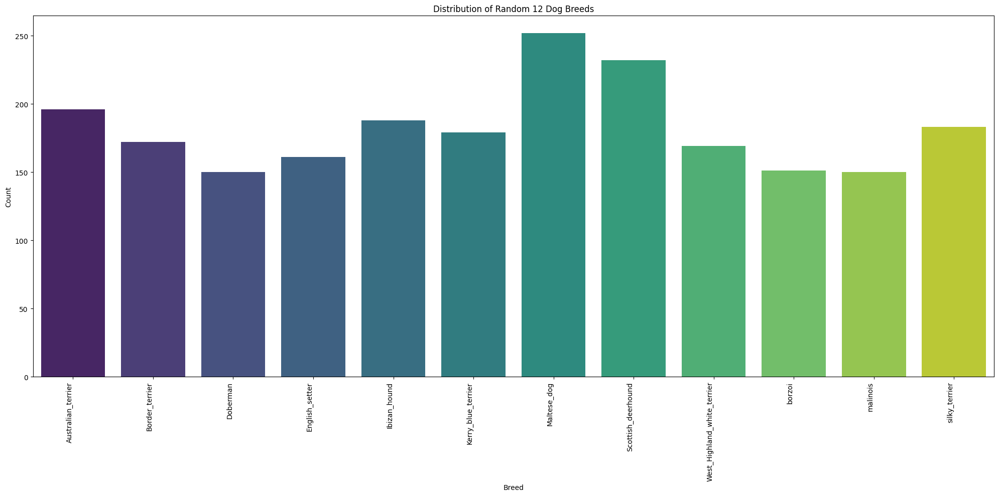

In [ ]:
# Plot the distribution of the selected 12 breeds
unique_labels, label_counts = np.unique(Y, return_counts=True)
plt.figure(figsize=(20, 10))
sns.barplot(x=unique_labels, y=label_counts, palette='viridis')
plt.title('Distribution of Random 12 Dog Breeds')
plt.xlabel('Breed')
plt.ylabel('Count')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
# Additional code to revert the images and annotations to the original format

# Revert the images and annotations to the original format
original_format_images = []
original_format_annotations = []

for image in X:
    # Extract the breed name from the path
    breed_name = image.split('/')[-2]
    # Find the original breed name with the prefix
    for original_breed in breed_list:
        if breed_name == original_breed.split('-')[-1]:
            original_breed_name = original_breed
            break
    # Construct the original format path
    original_path = image.replace(breed_name, original_breed_name)
    original_format_images.append(original_path)

for annotation in Y:
    # Find the original breed name with the prefix
    for original_breed in breed_list:
        if annotation == original_breed.split('-')[-1]:
            original_breed_name = original_breed
            break
    original_format_annotations.append(original_breed_name)

# Convert lists to numpy arrays
X = np.asarray(original_format_images)
Y = np.asarray(original_format_annotations)

# Print the first 5 elements to check the result
print(X[:5])
print(Y[:5])

['/kaggle/input/stanford-dogs-dataset/images/Images/n02107142-Doberman/n02107142_10009.jpg'
 '/kaggle/input/stanford-dogs-dataset/images/Images/n02107142-Doberman/n02107142_10036.jpg'
 '/kaggle/input/stanford-dogs-dataset/images/Images/n02107142-Doberman/n02107142_10070.jpg'
 '/kaggle/input/stanford-dogs-dataset/images/Images/n02107142-Doberman/n02107142_10647.jpg'
 '/kaggle/input/stanford-dogs-dataset/images/Images/n02107142-Doberman/n02107142_1073.jpg']
['n02107142-Doberman' 'n02107142-Doberman' 'n02107142-Doberman'
 'n02107142-Doberman' 'n02107142-Doberman']


## **Crop the images**

In [ ]:
# Function to parse the bounding box data from the annotation file
def parse_annotation(annotation_path):
    tree = ET.parse(annotation_path)
    root = tree.getroot()
    bndboxes = []
    for obj in root.findall('object'):
        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
        bndboxes.append((xmin, ymin, xmax, ymax))
    return bndboxes

# Function to crop the image using the bounding box data and save them as .jpg files
def crop_and_save_images(image_path, bndboxes, output_dir):
    img = Image.open(image_path)
    cropped_image_paths = []
    for i, bndbox in enumerate(bndboxes):
        xmin, ymin, xmax, ymax = bndbox
        cropped_img = img.crop((xmin, ymin, xmax, ymax))
        cropped_img = cropped_img.resize((224, 224))
        cropped_img_path = os.path.join(output_dir, f"{os.path.basename(image_path).split('.')[0]}_crop_{i}.jpg")
        cropped_img.save(cropped_img_path)
        cropped_image_paths.append(cropped_img_path)
    return cropped_image_paths

# Function to display images
def display_images(original_images, cropped_images):
    num_images = len(original_images)
    plt.figure(figsize=(12, 8))
    for i in range(num_images):
        # Display original image
        img = Image.open(original_images[i])
        plt.subplot(num_images, 2, 2 * i + 1)
        plt.imshow(img)
        plt.title(f"Original")
        plt.axis("off")

        # Display cropped image
        cropped_img = Image.open(cropped_images[i])
        plt.subplot(num_images, 2, 2 * i + 2)
        plt.imshow(cropped_img)
        plt.title(f"Cropped")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

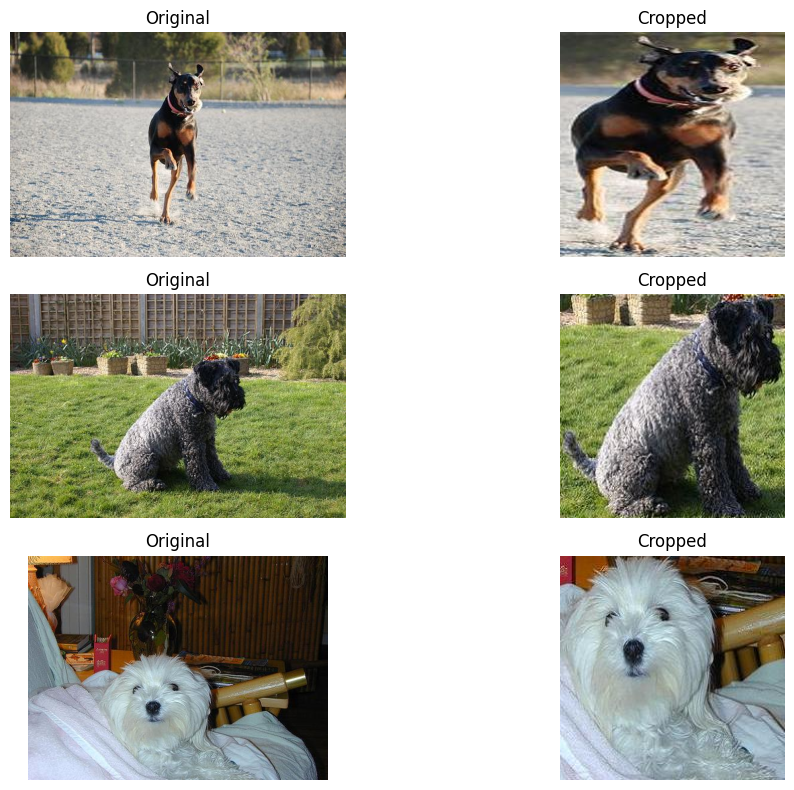

Shape of X_cropped: (2298,)
Shape of Y_cropped: (2298,)
['/kaggle/working/stanford-dogs-dataset/images/Images/n02107142_10009_crop_0.jpg'
 '/kaggle/working/stanford-dogs-dataset/images/Images/n02107142_10036_crop_0.jpg'
 '/kaggle/working/stanford-dogs-dataset/images/Images/n02107142_10070_crop_0.jpg'
 '/kaggle/working/stanford-dogs-dataset/images/Images/n02107142_10647_crop_0.jpg'
 '/kaggle/working/stanford-dogs-dataset/images/Images/n02107142_1073_crop_0.jpg']
['n02107142-Doberman' 'n02107142-Doberman' 'n02107142-Doberman'
 'n02107142-Doberman' 'n02107142-Doberman']


In [ ]:
cropped_image_dir = '/kaggle/working/stanford-dogs-dataset/images/Images/'

# Create the directory for cropped images if it doesn't exist
os.makedirs(cropped_image_dir, exist_ok=True)

# Crop the images using bounding boxes and assign labels
cropped_images_list = []
cropped_labels_list = []
original_images_list = []
image_to_cropped = {}  # Dictionary to map original images to their cropped versions

for image_path, annotation in zip(X, Y):
    annotation_path = image_path.replace('/images/Images/', '/annotations/Annotation/').replace('.jpg', '')
    bndboxes = parse_annotation(annotation_path)
    cropped_image_paths = crop_and_save_images(image_path, bndboxes, cropped_image_dir)
    cropped_images_list.extend(cropped_image_paths)

    # Use the original annotation as the label for all cropped images
    cropped_labels_list.extend([annotation] * len(cropped_image_paths))
    original_images_list.append(image_path)
    image_to_cropped[image_path] = cropped_image_paths

# Randomly select 3 indices to display
random_indices = random.sample(range(len(original_images_list)), 3)
selected_image_paths = [original_images_list[idx] for idx in random_indices]
selected_cropped_images_list = [img_path for idx in random_indices for img_path in image_to_cropped[original_images_list[idx]]]

# Display the images
display_images(selected_image_paths, selected_cropped_images_list)

# Convert the lists to numpy arrays
X_cropped = np.array(cropped_images_list)
Y_cropped = np.array(cropped_labels_list)

# Print the shapes of X_cropped and Y_cropped
print(f"Shape of X_cropped: {X_cropped.shape}")
print(f"Shape of Y_cropped: {Y_cropped.shape}")

# Print the first 5 elements to check the result
print(X_cropped[:5])
print(Y_cropped[:5])

## **Split the dataset**

In [ ]:
# Constants for data processing
train_split_percent = 0.7  # 70% for training
validation_split_percent = 0.15  # 15% for validation
test_split_percent = 0.15  # 15% for testing

# Step 1: Split the data into training/validation and test sets
train_validate_x, test_x, train_validate_y, test_y = train_test_split(
    X_cropped, Y_cropped, test_size=test_split_percent)

# Step 2: Split the training/validation set into training and validation sets
train_x, validate_x, train_y, validate_y = train_test_split(
    train_validate_x, train_validate_y, test_size=validation_split_percent / (1 - test_split_percent))

# Output the shapes of the datasets for verification
print(f"Training set: {train_x.shape}, {train_y.shape}")
print(f"Validation set: {validate_x.shape}, {validate_y.shape}")
print(f"Test set: {test_x.shape}, {test_y.shape}")

Training set: (1608,), (1608,)
Validation set: (345,), (345,)
Test set: (345,), (345,)


## **Resize the images**

In [ ]:
# Define a function to load and resize an image
def load_image(path, label):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=num_channels)
    image = tf.image.resize(image,[image_height,image_width])
    return image, label

# Define a function to normalize an image
def normalize(image, label):
    image = image/255
    return image, label

## **Build data generator**

In [ ]:
# https://www.tensorflow.org/guide/data_performance
# AUTOTUNE will prompt the tf.data runtime to tune the value dynamically at runtime.
# This could reduce the CPU usage and improve the throughput of the data pipeline.
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [ ]:
# Set image dimensions, number of channels, and number of classes
image_width = 128
image_height = 128
num_channels = 3
num_classes = len(random_breeds)

# Set the number of epochs and batch sizes
epochs = 30
train_batch_size = 32
validation_batch_size = 32
test_batch_size = 32

# Convert the labels to one-hot-encoded format
train_processed_y = np.asarray([label2index[label] for label in train_y])
validate_processed_y = np.asarray([label2index[label] for label in validate_y])
test_processed_y = np.asarray([label2index[label] for label in test_y])
train_processed_y = to_categorical(train_processed_y, num_classes=num_classes, dtype='float32')
validate_processed_y = to_categorical(validate_processed_y, num_classes=num_classes, dtype='float32')
test_processed_y = to_categorical(test_processed_y, num_classes=num_classes, dtype='float32')

# Calculate the number of steps per epoch for training and validation
train_data_count = train_x.shape[0]
steps_per_epoch = int(train_data_count / train_batch_size)
validation_data_count = validate_x.shape[0]
validation_steps = int(validation_data_count / validation_batch_size)

In [ ]:
# Define a function to build data generators
def build_data_generators(train_data_process_list=[load_image,normalize],validate_data_process_list=[load_image,normalize],test_data_process_list=[load_image,normalize]):

    # Create TensorFlow Datasets for training, validation, and test data
    train_data = tf.data.Dataset.from_tensor_slices((train_x.tolist(), train_processed_y.tolist()))
    validation_data = tf.data.Dataset.from_tensor_slices((validate_x.tolist(), validate_processed_y.tolist()))
    test_data = tf.data.Dataset.from_tensor_slices((test_x.tolist(), test_processed_y.tolist()))

    # Shuffle and preprocess the training data
    train_data = train_data.shuffle(train_data_count)
    for process in train_data_process_list:
        train_data = train_data.map(process, num_parallel_calls=AUTOTUNE)
    train_data = train_data.repeat(epochs).batch(train_batch_size)

    # Shuffle and preprocess the validation data
    validation_data = validation_data.shuffle(validation_data_count)
    for process in validate_data_process_list:
        validation_data = validation_data.map(process, num_parallel_calls=AUTOTUNE)
    validation_data = validation_data.repeat(epochs).batch(validation_batch_size)

    # Preprocess the test data
    for process in test_data_process_list:
        test_data = test_data.map(process, num_parallel_calls=AUTOTUNE)
    test_data = test_data.repeat(1).batch(test_batch_size)

    return train_data, validation_data, test_data

In [ ]:
# Build the data generators
train_data, validation_data, test_data = build_data_generators()

# Print the data generators
print("train_data",train_data)
print("validation_data",validation_data)
print("test_data",test_data)

train_data <_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 12), dtype=tf.float32, name=None))>
validation_data <_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 12), dtype=tf.float32, name=None))>
test_data <_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 12), dtype=tf.float32, name=None))>


## **Create utility function**

In [ ]:
# Define a custom JSON encoder to handle numpy and decimal types
class JsonEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, decimal.Decimal):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        else:
            return super(JsonEncoder, self).default(obj)

# Function to load model metrics from a JSON file
def get_model_metrics():
    with open("/kaggle/working/SavedModels/model_metrics.json") as json_file:
        model_metrics = json.load(json_file)
    return model_metrics

# Function to save model metrics to a JSON file
def save_model_metrics(model_name="model_1",metrics={}):
    if os.path.exists("/kaggle/working/SavedModels/model_metrics.json"):
        with open("/kaggle/working/SavedModels/model_metrics.json") as json_file:
            model_metrics = json.load(json_file)
    else:
        model_metrics = {}
    model_metrics[model_name] = metrics
    with open("/kaggle/working/SavedModels/model_metrics.json", 'w') as json_file:
        json_file.write(json.dumps(model_metrics, cls=JsonEncoder))

# Function to save the model, its weights, and its structure
def save_model(path="/kaggle/working/SavedModels",model_name="model01"):
    filename = "/kaggle/working/SavedModels/"
    os.makedirs(os.path.dirname(filename), exist_ok=True)
    model.save(os.path.join(path,model_name+".hdf5"))
    model.save_weights(os.path.join(path,model_name+".weight.h5"))
    model_json = model.to_json()
    with open(os.path.join(path,model_name+".json"), "w") as json_file:
        json_file.write(model_json)

# Function to get the size of the model
def get_model_size(path="/kaggle/working/SavedModels",model_name="model01"):
    model_size = os.stat(os.path.join(path,model_name+".hdf5")).st_size
    return model_size

# Function to evaluate the model, plot the training results, and save the model and its metrics
def evaluate_save_model(model,training_results,test_data,execution_time, learning_rate, batch_size, epochs, optimizer,momentum = None, save=True):
    model_train_history = training_results.history
    num_epochs = len(model_train_history["loss"])
    fig = plt.figure(figsize=(15,5))
    axs = fig.add_subplot(1,2,1)
    axs.set_title('Loss')
    for metric in ["loss","val_loss"]:
        axs.plot(np.arange(0, num_epochs), model_train_history[metric], label=metric)
    axs.legend()
    axs = fig.add_subplot(1,2,2)
    axs.set_title('Accuracy')
    for metric in ["accuracy","val_accuracy"]:
        axs.plot(np.arange(0, num_epochs), model_train_history[metric], label=metric)
    axs.legend()
    plt.show()
    evaluation_results = model.evaluate(test_data)
    print('Evaluation results: [loss, accuracy]', evaluation_results)
    if save:
        save_model(model_name=model.name)
        model_size = get_model_size(model_name=model.name)
        with open(os.path.join("/kaggle/working/SavedModels",model.name+"_train_history.json"), "w") as json_file:
            json_file.write(json.dumps(model_train_history,cls=JsonEncoder))
        trainable_parameters = model.count_params()
        metrics ={
            "trainable_parameters":trainable_parameters,
            "execution_time":execution_time,
            "loss":evaluation_results[0],
            "accuracy":evaluation_results[1],
            "model_size":model_size,
            "learning_rate":learning_rate,
            "batch_size":batch_size,
            'momentum': momentum,
            "epochs":epochs,
            "optimizer":type(optimizer).__name__
        }
        save_model_metrics(model_name=model.name,metrics=metrics)

# **VGG19**
Use VGG19 as the base and fine tune the last conv2d block for our problem

In [ ]:
# Function to view the layers of a model
def view_layers(model):
    # Get the layers of the model
    layers = model.layers
    layers_list = []

    # Loop over the layers
    for idx, layer in enumerate(layers):
        # Append a dictionary with the layer type and its trainable status to the list
        layers_list.append({
            'layer': type(layer).__name__,  # The type of the layer
            'trainable':layer.trainable     # Whether the layer is trainable or not
        })

    # Convert the list of dictionaries to a DataFrame
    df = pd.DataFrame(layers_list)

    # Return the DataFrame
    return df

## **Build model**

In [ ]:
# vgg19 with fine tuning the last conv2d base
vgg19 = VGG19(include_top=False, weights='imagenet', input_shape=(image_height,image_width,3))

layers_df = view_layers(vgg19)
print(layers_df[10:])

80134624/80134624 [==============================] - 0s 0us/step
           layer  trainable
10        Conv2D       True
11  MaxPooling2D       True
12        Conv2D       True
13        Conv2D       True
14        Conv2D       True
15        Conv2D       True
16  MaxPooling2D       True
17        Conv2D       True
18        Conv2D       True
19        Conv2D       True
20        Conv2D       True
21  MaxPooling2D       True


## **Training params**

In [ ]:
############################
# Training Params
############################
learning_rate = 0.001
batch_size = 32
epochs = 50
############################


# Set all layers as trainable false execpt last conv block
for layer in vgg19.layers[:-4]:
    layer.trainable = False

# Input
model_input = vgg19.layers[0].input

# Final pool layer
hidden = vgg19.layers[-1]
print("Pool Layer",hidden)

# Flatten
hidden = layers.Flatten()(hidden.output)

#  Hidden Layer, Classification Block
hidden = layers.Dense(units=1024, activation='relu')(hidden)
hidden = layers.Dense(units=1024, activation='relu')(hidden)

# Output Layer
output = layers.Dense(units=num_classes, activation='softmax')(hidden)

# Build model
model = Model(model_input, output, name='VGG19')

# Optimizer
optimizer = optimizers.SGD(lr=learning_rate)

# Loss
loss = losses.categorical_crossentropy

# Compile
model.compile(loss=loss,
                  optimizer=optimizer,
                  metrics=['accuracy'])

#print(model.summary())
layers_df = view_layers(model)
print(layers_df.head(25))

Pool Layer <keras.src.layers.pooling.max_pooling2d.MaxPooling2D object at 0x78ec07f295d0>
           layer  trainable
0     InputLayer      False
1         Conv2D      False
2         Conv2D      False
3   MaxPooling2D      False
4         Conv2D      False
5         Conv2D      False
6   MaxPooling2D      False
7         Conv2D      False
8         Conv2D      False
9         Conv2D      False
10        Conv2D      False
11  MaxPooling2D      False
12        Conv2D      False
13        Conv2D      False
14        Conv2D      False
15        Conv2D      False
16  MaxPooling2D      False
17        Conv2D      False
18        Conv2D       True
19        Conv2D       True
20        Conv2D       True
21  MaxPooling2D       True
22       Flatten       True
23         Dense       True
24         Dense       True


## **Train model**

In [ ]:
# Train model

# Early Stopping
earlystopping = EarlyStopping(monitor='val_accuracy', patience=10);

# Model Checkpoint
checkpoint_filepath = '/kaggle/working/Checkpoints/checkpoint_VGG19.weights.h5'
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    verbose=1,
    mode='max',
    save_best_only=True)


start_time = time.time()
training_results = model.fit(
        train_data,
        validation_data=validation_data,
        callbacks=[earlystopping,model_checkpoint_callback],
        epochs=epochs,
        verbose=1,
        steps_per_epoch=steps_per_epoch,
        validation_steps=validation_steps)
execution_time = (time.time() - start_time)/60.0
print("Training execution time (mins)",execution_time)

Epoch 1/50


I0000 00:00:1717732521.470689     136 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


49/50 [============================>.] - ETA: 0s - loss: 2.2508 - accuracy: 0.2379
Epoch 1: val_accuracy improved from -inf to 0.31250, saving model to /kaggle/working/Checkpoints/checkpoint_VGG19.weights.h5
50/50 [==============================] - 7s 53ms/step - loss: 2.2474 - accuracy: 0.2387 - val_loss: 1.9225 - val_accuracy: 0.3125
Epoch 2/50
49/50 [============================>.] - ETA: 0s - loss: 1.6633 - accuracy: 0.4330
Epoch 2: val_accuracy improved from 0.31250 to 0.41563, saving model to /kaggle/working/Checkpoints/checkpoint_VGG19.weights.h5
50/50 [==============================] - 2s 50ms/step - loss: 1.6658 - accuracy: 0.4325 - val_loss: 1.7294 - val_accuracy: 0.4156
Epoch 3/50
49/50 [============================>.] - ETA: 0s - loss: 1.2414 - accuracy: 0.5842
Epoch 3: val_accuracy improved from 0.41563 to 0.54375, saving model to /kaggle/working/Checkpoints/checkpoint_VGG19.weights.h5
50/50 [==============================] - 3s 61ms/step - loss: 1.2381 - accuracy: 0.5856 

## **Save model**

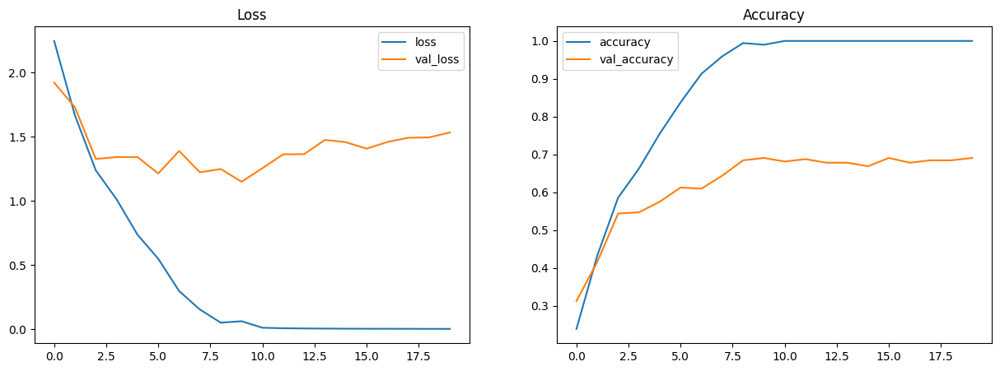

11/11 [==============================] - 2s 166ms/step - loss: 2.3197 - accuracy: 0.6899
Evaluation results: [loss, accuracy] [2.319671154022217, 0.6898550987243652]


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Evaluate and Save model
evaluate_save_model(model,training_results,test_data,execution_time, learning_rate, batch_size, epochs, optimizer)

### **Display predictions**

11/11 [==============================] - 0s 26ms/step


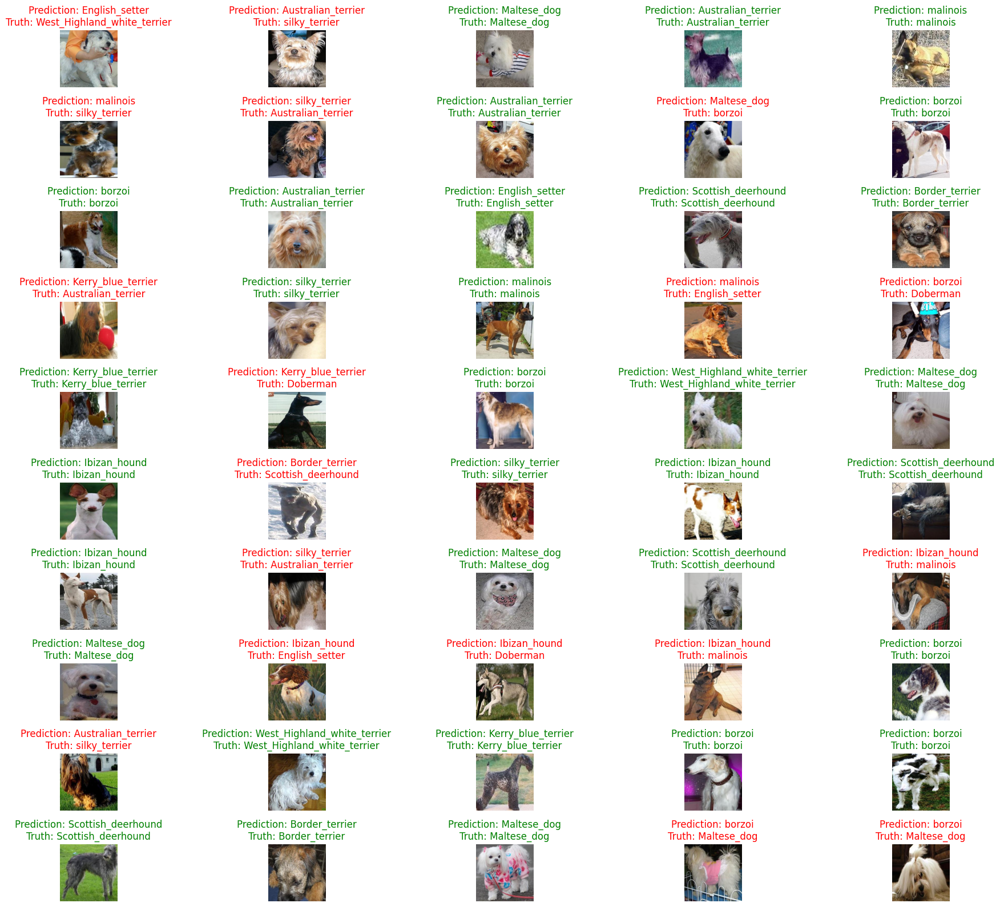

# of true predictions:  32
# of false predictions:  18


In [ ]:
# load best model with best weights
prediction_model = tf.keras.models.load_model('/kaggle/working/SavedModels/VGG19.hdf5')
checkpoint_path = '/kaggle/working/Checkpoints/checkpoint_VGG19.weights.h5'
prediction_model.load_weights(checkpoint_path)

# make predictions
test_predictions = prediction_model.predict(test_data)

# Load Test images
test_x_display = []
target_size = (224, 224)
for path in test_x:
    # read image
    image = cv2.imread(path)
    # convert to rgb
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # resize image
    image = cv2.resize(image, target_size)
    # Train x
    test_x_display.append(image)

# Convert to numpy array
test_x_display = np.asarray(test_x_display)

# add true and predicted breed for each dog image
# mark it green if prediction is true, otherwise red
# count the total number of true predictions for the first 100 images
true_predict = 0
false_predict = 0
fig = plt.figure(figsize=(20,16))
for i,file in enumerate(test_x_display[:50]):
    axs = fig.add_subplot(10,5,i+1)
    axs.set_aspect('equal')
    predicted_breed = index2label[test_predictions.argmax(axis=1)[i]][10:] # [10:] truncates leading unnecessary letters
    true_breed = test_y[i][10:]
    # color code true/false predictions
    if true_breed == predicted_breed:
      axs.set_title('Prediction: ' + predicted_breed + '\n' + 'Truth: ' + true_breed,color='green')
      true_predict += 1
    else:
      axs.set_title('Prediction: ' + predicted_breed + '\n' + 'Truth: ' + true_breed,color='red')
      false_predict += 1
    plt.imshow(test_x_display[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

print('# of true predictions: ', true_predict)
print('# of false predictions: ', false_predict)

## **Evaluate model**

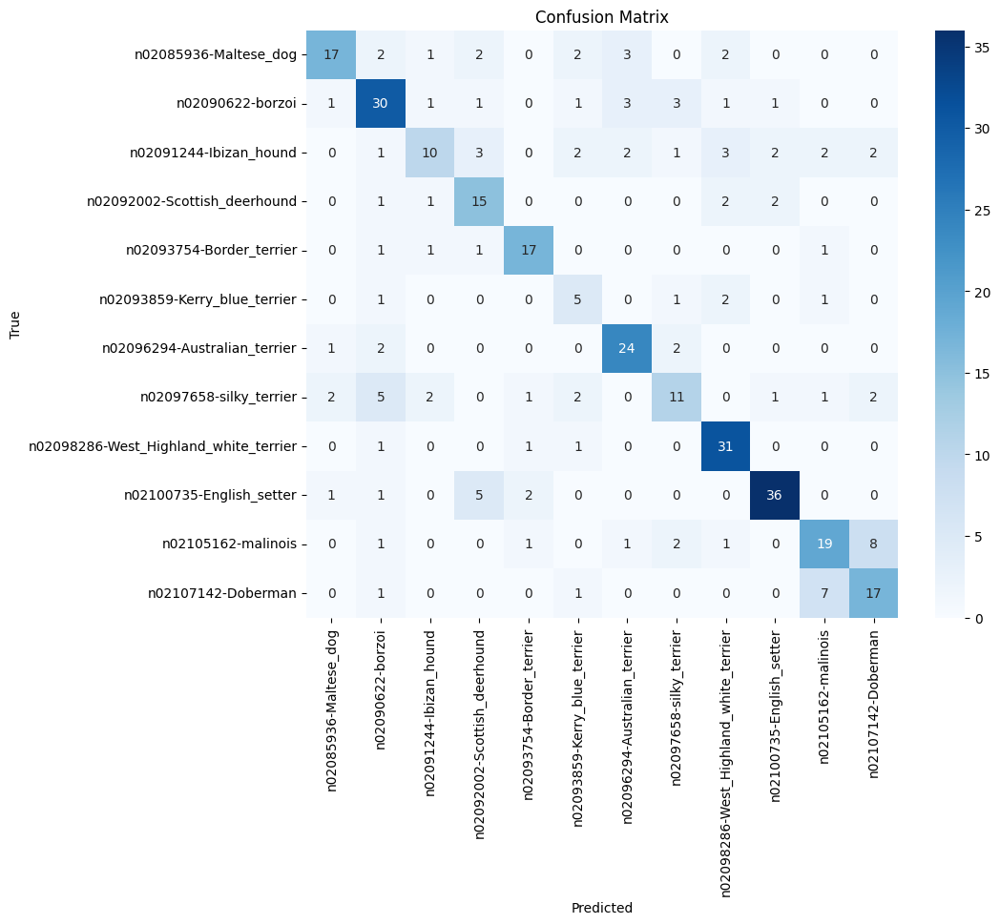

                                       precision    recall  f1-score
n02085936-Maltese_dog                   0.772727  0.586207  0.666667
n02090622-borzoi                        0.638298  0.714286  0.674157
n02091244-Ibizan_hound                  0.625000  0.357143  0.454545
n02092002-Scottish_deerhound            0.555556  0.714286  0.625000
n02093754-Border_terrier                0.772727  0.809524  0.790698
n02093859-Kerry_blue_terrier            0.357143  0.500000  0.416667
n02096294-Australian_terrier            0.727273  0.827586  0.774194
n02097658-silky_terrier                 0.550000  0.407407  0.468085
n02098286-West_Highland_white_terrier   0.738095  0.911765  0.815789
n02100735-English_setter                0.857143  0.800000  0.827586
n02105162-malinois                      0.612903  0.575758  0.593750
n02107142-Doberman                      0.586207  0.653846  0.618182
accuracy                                0.672464  0.672464  0.672464
macro avg                         

In [ ]:
# Convert predictions to class labels
predicted_labels = np.argmax(test_predictions, axis=1)
true_labels = np.argmax(test_processed_y, axis=1)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Visualize the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=sorted(label2index.keys()), yticklabels=sorted(label2index.keys()))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=sorted(label2index.keys()), output_dict=True)

# Convert report to DataFrame for better visualization
report_df = pd.DataFrame(report).transpose()

# Display the table with accuracy, precision, recall, and F1-score
print(report_df[['precision', 'recall', 'f1-score']])

# **ResNet152V2 with Adam optimizer**

In [ ]:
resnet152_v2 = ResNet152V2(
    include_top=False,
    input_shape=(128, 128, 3)
)

234545216/234545216 [==============================] - 1s 0us/step


## **Build model**

In [ ]:
# Build model for Resnet
def build_resnet_model(model_name = 'ResNet152V2',print_summary=True):
  # Set all layers as hidden
  for layer in resnet152_v2.layers:
      layer.trainable = False

  # Input
  model_input = resnet152_v2.layers[0].input

  # Extract final pool layer
  hidden = resnet152_v2.layers[-1]

  # Flatten
  hidden = layers.Flatten()(hidden.output)

  # Output Layer
  output = layers.Dense(units=12, activation='softmax')(hidden)

  # Create model
  model = Model(model_input, output, name=model_name)

  # Print the model architecture
  if print_summary:
    print(model.summary())

  return model

## Training params

In [ ]:
############################
# Training Params
############################
batch_size = 32
epochs = 50
############################

# Early Stopping
earlystopping = EarlyStopping(monitor='val_accuracy', patience=10);

# Model Checkpoint
checkpoint_filepath = '/kaggle/working/Checkpoints/checkpoint_ResNet152V2.weights.h5'
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    verbose=1,
    mode='max',
    save_best_only=True)

# Build the model
model = build_resnet_model()

# Optimier
optimizer = optimizers.Adam()

# Loss
loss = losses.categorical_crossentropy

# Compile
model.compile(loss=loss,
                  optimizer=optimizer,
                  metrics=['accuracy'])

Model: "ResNet152V2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 134, 134, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 64, 64, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 66, 66, 64)           0         ['conv1_conv[0][0]']          
                                                                                        

## **Train model**

In [ ]:
# Train model
start_time = time.time()
training_results = model.fit(
        train_data,
        validation_data=validation_data,
        epochs=epochs,
        callbacks=[earlystopping,model_checkpoint_callback],
        verbose=1,
        steps_per_epoch=steps_per_epoch,
        validation_steps=validation_steps)
execution_time = (time.time() - start_time)/60.0
print("Training execution time (mins)",execution_time)

Epoch 1/50
50/50 [==============================] - ETA: 0s - loss: 2.3515 - accuracy: 0.8087
Epoch 1: val_accuracy improved from -inf to 0.87500, saving model to /kaggle/working/Checkpoints/checkpoint_ResNet152V2.weights.h5
50/50 [==============================] - 18s 163ms/step - loss: 2.3515 - accuracy: 0.8087 - val_loss: 2.0632 - val_accuracy: 0.8750
Epoch 2/50
50/50 [==============================] - ETA: 0s - loss: 0.5186 - accuracy: 0.9538
Epoch 2: val_accuracy improved from 0.87500 to 0.88437, saving model to /kaggle/working/Checkpoints/checkpoint_ResNet152V2.weights.h5
50/50 [==============================] - 6s 111ms/step - loss: 0.5186 - accuracy: 0.9538 - val_loss: 2.3607 - val_accuracy: 0.8844
Epoch 3/50
50/50 [==============================] - ETA: 0s - loss: 0.2017 - accuracy: 0.9794
Epoch 3: val_accuracy improved from 0.88437 to 0.90000, saving model to /kaggle/working/Checkpoints/checkpoint_ResNet152V2.weights.h5
50/50 [==============================] - 6s 112ms/step -

## **Save model**

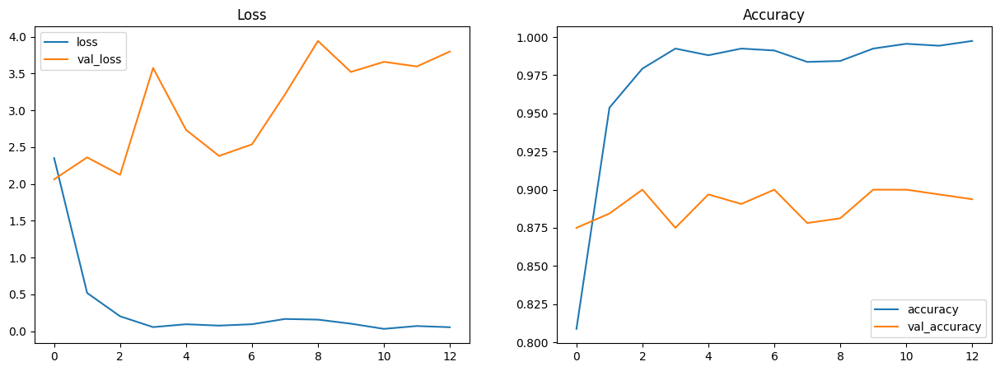

11/11 [==============================] - 2s 148ms/step - loss: 2.7884 - accuracy: 0.9275
Evaluation results: [loss, accuracy] [2.788440704345703, 0.9275362491607666]


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Save model
learning_rate = 0.001;
evaluate_save_model(model,training_results,test_data,execution_time, learning_rate, batch_size, epochs, optimizer)

## **Add data augmentation to ResNet152V2**

In [ ]:
# Create data augmentation processors

# https://www.tensorflow.org/api_docs/python/tf/image/adjust_brightness
def adjust_brightness(image, label):
    return tf.image.adjust_brightness(image, 0.01), label

# https://www.tensorflow.org/api_docs/python/tf/image/adjust_contrast
def adjust_contrast(image, label):
    return tf.image.adjust_contrast(image, 1.2), label

# Apply data processing + data augmentation steps
data_process_list=[load_image, normalize, adjust_brightness, adjust_contrast]

# Build data generators for train, validate, test
train_data, validation_data, test_data = build_data_generators(train_data_process_list=data_process_list)
print("train_data",train_data)
print("validation_data",validation_data)
print("test_data",test_data)

train_data <_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 12), dtype=tf.float32, name=None))>
validation_data <_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 12), dtype=tf.float32, name=None))>
test_data <_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 12), dtype=tf.float32, name=None))>


## **Build model**

In [ ]:
############################
# Training Params
############################
batch_size = 32
epochs = 50
############################

# Early Stopping
earlystopping = EarlyStopping(monitor='val_accuracy', patience=10);

# Model Checkpoint
checkpoint_filepath = '/kaggle/working/Checkpoints/checkpoint_ResNet152V2DataAug.weights.h5'
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    verbose=1,
    mode='max',
    save_best_only=True)

# Build the model
model = build_resnet_model(model_name='ResNet152V2_DataAug')

# Loads the weights
checkpoint_path = '/kaggle/working/Checkpoints/checkpoint_ResNet152V2.weights.h5'
model.load_weights(checkpoint_path)

# Optimier
optimizer = optimizers.Adam()

# Loss
loss = losses.categorical_crossentropy

# Compile
model.compile(loss=loss,
                  optimizer=optimizer,
                  metrics=['accuracy'])

Model: "ResNet152V2_DataAug"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 134, 134, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 64, 64, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 66, 66, 64)           0         ['conv1_conv[0][0]']          
                                                                                

## **Train model**

In [ ]:
# Train model
start_time = time.time()
training_results = model.fit(
        train_data,
        validation_data=validation_data,
        epochs=epochs,
        callbacks=[earlystopping,model_checkpoint_callback],
        verbose=1,
        steps_per_epoch=steps_per_epoch,
        validation_steps=validation_steps)
execution_time = (time.time() - start_time)/60.0
print("Training execution time (mins)",execution_time)

Epoch 1/50
50/50 [==============================] - ETA: 0s - loss: 0.3443 - accuracy: 0.9719
Epoch 1: val_accuracy improved from -inf to 0.86250, saving model to /kaggle/working/Checkpoints/checkpoint_ResNet152V2DataAug.weights.h5
50/50 [==============================] - 17s 163ms/step - loss: 0.3443 - accuracy: 0.9719 - val_loss: 3.8847 - val_accuracy: 0.8625
Epoch 2/50
50/50 [==============================] - ETA: 0s - loss: 0.3615 - accuracy: 0.9731
Epoch 2: val_accuracy did not improve from 0.86250
50/50 [==============================] - 4s 74ms/step - loss: 0.3615 - accuracy: 0.9731 - val_loss: 4.1602 - val_accuracy: 0.8469
Epoch 3/50
50/50 [==============================] - ETA: 0s - loss: 0.2585 - accuracy: 0.9781
Epoch 3: val_accuracy improved from 0.86250 to 0.89062, saving model to /kaggle/working/Checkpoints/checkpoint_ResNet152V2DataAug.weights.h5
50/50 [==============================] - 6s 112ms/step - loss: 0.2585 - accuracy: 0.9781 - val_loss: 3.1801 - val_accuracy: 0.

## **Save model**

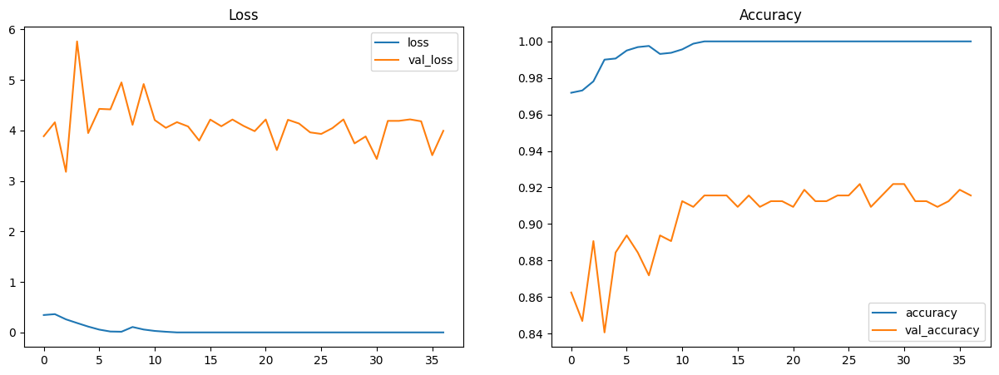

11/11 [==============================] - 1s 57ms/step - loss: 3.7710 - accuracy: 0.9072
Evaluation results: [loss, accuracy] [3.7710201740264893, 0.9072463512420654]


In [ ]:
# Evaluate and Save model
evaluate_save_model(model,training_results,test_data,execution_time, learning_rate, batch_size, epochs, optimizer)

## **Display predictions**

11/11 [==============================] - 3s 54ms/step


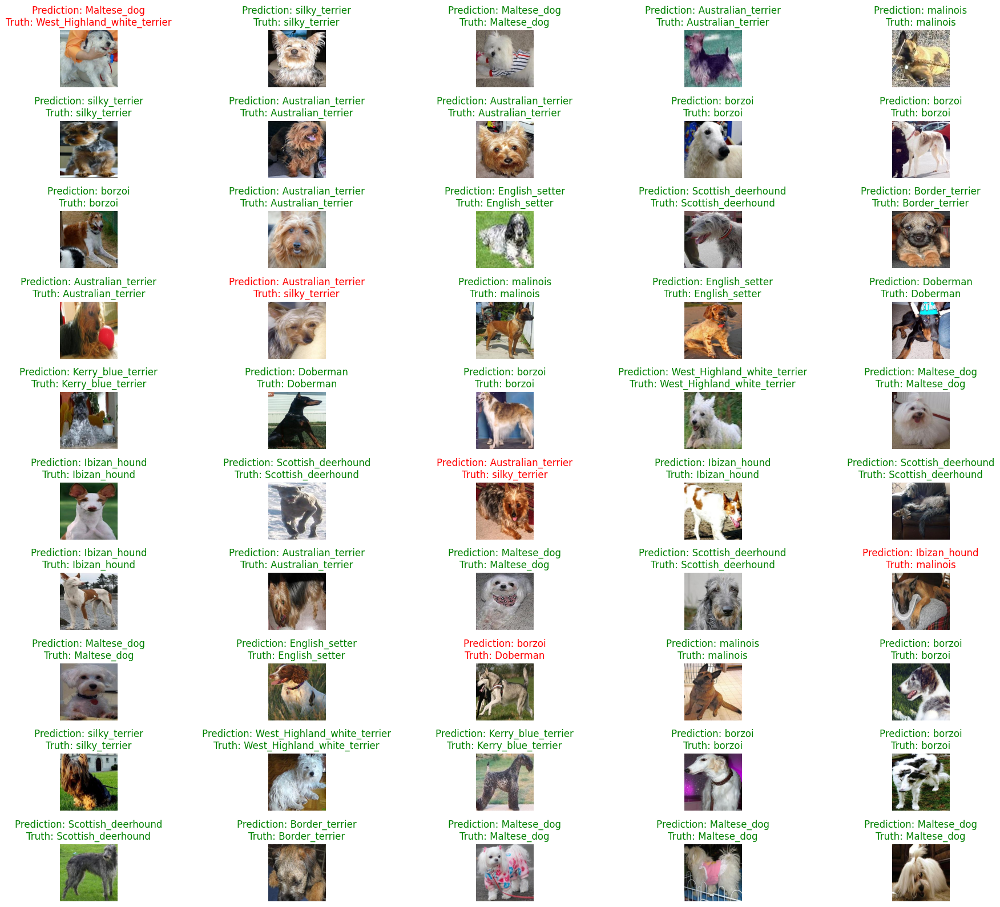

# of true predictions:  45
# of false predictions:  5


In [ ]:
# load best model with best weights
prediction_model = tf.keras.models.load_model('/kaggle/working/SavedModels/ResNet152V2_DataAug.hdf5')
checkpoint_path = '/kaggle/working/Checkpoints/checkpoint_ResNet152V2DataAug.weights.h5'
prediction_model.load_weights(checkpoint_path)

# make predictions
test_predictions = prediction_model.predict(test_data)

# Load Test images
test_x_display = []
target_size = (224, 224)
for path in test_x:
    # read image
    image = cv2.imread(path)
    # convert to rgb
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # resize image
    image = cv2.resize(image, target_size)
    # Train x
    test_x_display.append(image)

# Convert to numpy array
test_x_display = np.asarray(test_x_display)

# add true and predicted breed for each dog image
# mark it green if prediction is true, otherwise red
# count the total number of true predictions for the first 100 images
true_predict = 0
false_predict = 0
fig = plt.figure(figsize=(20,16))
for i,file in enumerate(test_x_display[:50]):
    axs = fig.add_subplot(10,5,i+1)
    axs.set_aspect('equal')
    predicted_breed = index2label[test_predictions.argmax(axis=1)[i]][10:] # [10:] truncates leading unnecessary letters
    true_breed = test_y[i][10:]
    # color code true/false predictions
    if true_breed == predicted_breed:
      axs.set_title('Prediction: ' + predicted_breed + '\n' + 'Truth: ' + true_breed,color='green')
      true_predict += 1
    else:
      axs.set_title('Prediction: ' + predicted_breed + '\n' + 'Truth: ' + true_breed,color='red')
      false_predict += 1
    plt.imshow(test_x_display[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

print('# of true predictions: ', true_predict)
print('# of false predictions: ', false_predict)

## **Evaluate model**

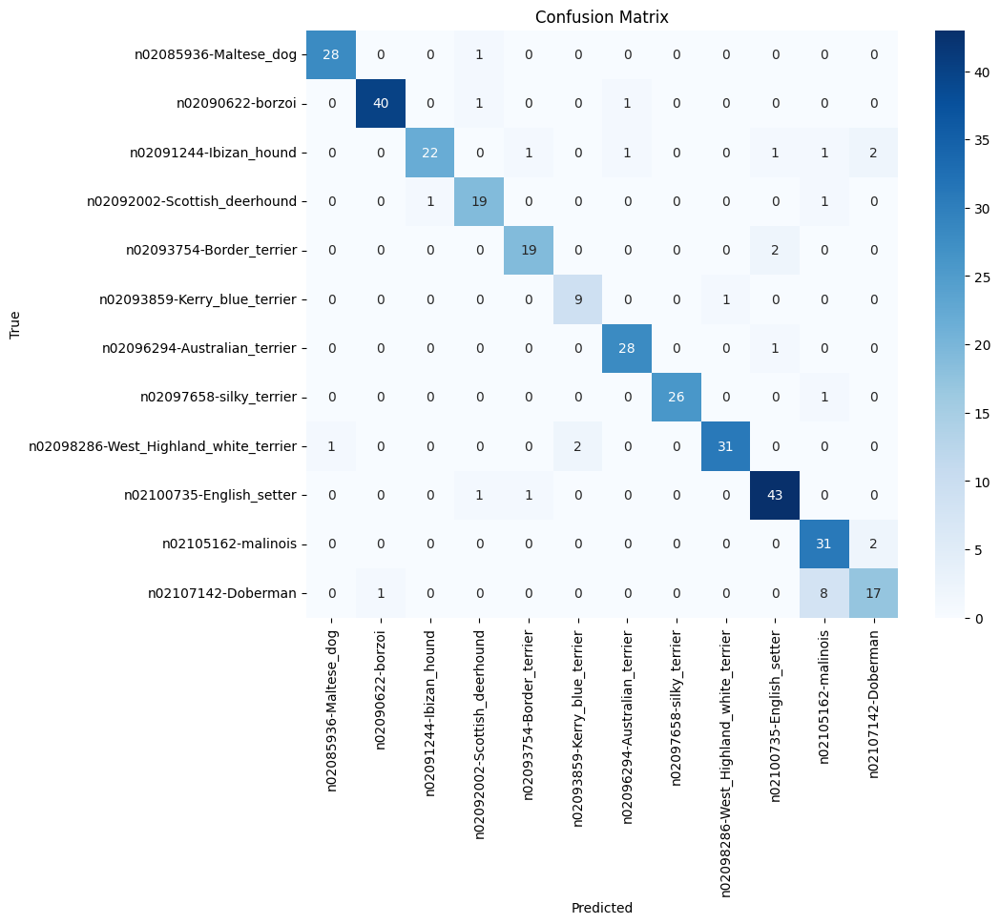

                                       precision    recall  f1-score
n02085936-Maltese_dog                   0.965517  0.965517  0.965517
n02090622-borzoi                        0.975610  0.952381  0.963855
n02091244-Ibizan_hound                  0.956522  0.785714  0.862745
n02092002-Scottish_deerhound            0.863636  0.904762  0.883721
n02093754-Border_terrier                0.904762  0.904762  0.904762
n02093859-Kerry_blue_terrier            0.818182  0.900000  0.857143
n02096294-Australian_terrier            0.933333  0.965517  0.949153
n02097658-silky_terrier                 1.000000  0.962963  0.981132
n02098286-West_Highland_white_terrier   0.968750  0.911765  0.939394
n02100735-English_setter                0.914894  0.955556  0.934783
n02105162-malinois                      0.738095  0.939394  0.826667
n02107142-Doberman                      0.809524  0.653846  0.723404
accuracy                                0.907246  0.907246  0.907246
macro avg                         

In [ ]:
# Convert predictions to class labels
predicted_labels = np.argmax(test_predictions, axis=1)
true_labels = np.argmax(test_processed_y, axis=1)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Visualize the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=sorted(label2index.keys()), yticklabels=sorted(label2index.keys()))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=sorted(label2index.keys()), output_dict=True)

# Convert report to DataFrame for better visualization
report_df = pd.DataFrame(report).transpose()

# Display the table with accuracy, precision, recall, and F1-score
print(report_df[['precision', 'recall', 'f1-score']])

# **InceptionResNetV2**

## **Build model**

In [ ]:
inceptionResnetv2 = InceptionResNetV2(
    input_shape=(128, 128, 3),
    include_top=False,
    weights='imagenet')

219055592/219055592 [==============================] - 1s 0us/step


In [ ]:
def build_inception_model(model_name='InceptionResNetV2', print_summary=True):
    # Load pre-trained InceptionResNetV2 model
    inceptionResnetv2 = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

    # Set all layers as non-trainable
    for layer in inceptionResnetv2.layers:
        layer.trainable = False

    # Input
    model_input = inceptionResnetv2.input

    # Extract final pool layer
    hidden = inceptionResnetv2.layers[-1]

    # Flatten
    hidden = layers.Flatten()(hidden.output)

    # Output Layer
    output = layers.Dense(units=12, activation='softmax')(hidden)

    # Create model
    model = Model(model_input, output, name=model_name)

    # Print the model architecture
    if print_summary:
        print(model.summary())

    return model

## **Training params**

In [ ]:
############################
# Training Params
############################
batch_size = 32
epochs = 50
############################

# Early Stopping
earlystopping = EarlyStopping(monitor='val_accuracy', patience=10);

# Model Checkpoint
checkpoint_filepath = '/kaggle/working/Checkpoints/checkpoint_InceptionResNetV2.weights.h5'
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    verbose=1,
    mode='max',
    save_best_only=True)

# Build the model
model = build_inception_model()

# Optimier
optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum = 0.99)

# Loss
loss = losses.categorical_crossentropy

# Compile
model.compile(loss=loss,
                  optimizer=optimizer,
                  metrics=['accuracy'])

Model: "InceptionResNetV2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv2d_203 (Conv2D)         (None, 63, 63, 32)           864       ['input_4[0][0]']             
                                                                                                  
 batch_normalization_203 (B  (None, 63, 63, 32)           96        ['conv2d_203[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_203 (Activation  (None, 63, 63, 32)           0         ['batch_normal

## **Train model**

In [ ]:
# Train model
start_time = time.time()
training_results = model.fit(
        train_data,
        validation_data=validation_data,
        epochs=epochs,
        callbacks=[earlystopping,model_checkpoint_callback],
        verbose=1,
        steps_per_epoch=steps_per_epoch,
        validation_steps=validation_steps)
execution_time = (time.time() - start_time)/60.0
print("Training execution time (mins)",execution_time)

## **Save model**

In [ ]:
# Save model
learning_rate = 0.001;
evaluate_save_model(model,training_results,test_data,execution_time, learning_rate, batch_size, epochs, optimizer)

## **Add data augmentation to InceptionResNetV2**



In [ ]:
# Create data augmentation processors

# https://www.tensorflow.org/api_docs/python/tf/image/adjust_brightness
def adjust_brightness(image, label):
    return tf.image.adjust_brightness(image, 0.01), label

# https://www.tensorflow.org/api_docs/python/tf/image/adjust_contrast
def adjust_contrast(image, label):
    return tf.image.adjust_contrast(image, 1.2), label

# Apply data processing + data augmentation steps
data_process_list=[load_image, normalize, adjust_brightness, adjust_contrast]

# Build data generators for train, validate, test
train_data, validation_data, test_data = build_data_generators(train_data_process_list=data_process_list)
print("train_data",train_data)
print("validation_data",validation_data)
print("test_data",test_data)

## **Build model**

In [ ]:
############################
# Training Params
############################
batch_size = 32
epochs = 50
############################

# Early Stopping
earlystopping = EarlyStopping(monitor='val_accuracy', patience=10);

# Model Checkpoint
checkpoint_filepath = '/kaggle/working/Checkpoints/checkpoint_InceptionResNetV2DataAug.weights.h5'
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    verbose=1,
    mode='max',
    save_best_only=True)

# Build the model
model = build_inception_model(model_name='InceptionResNetV2_DataAug')

# Loads the weights
checkpoint_path = '/kaggle/working/Checkpoints/checkpoint_InceptionResNetV2.weights.h5'
model.load_weights(checkpoint_path)

# Optimier
optimizer = optimizers.Adam()

# Loss
loss = losses.categorical_crossentropy

# Compile
model.compile(loss=loss,
                  optimizer=optimizer,
                  metrics=['accuracy'])

## **Train model**

In [ ]:
# Train model
start_time = time.time()
training_results = model.fit(
        train_data,
        validation_data=validation_data,
        epochs=epochs,
        callbacks=[earlystopping,model_checkpoint_callback],
        verbose=1,
        steps_per_epoch=steps_per_epoch,
        validation_steps=validation_steps)
execution_time = (time.time() - start_time)/60.0
print("Training execution time (mins)",execution_time)

50/50 [==============================] - ETA: 0s - loss: 30.8588 - accuracy: 0.9756
Epoch 1: val_accuracy improved from -inf to 0.92500, saving model to /kaggle/working/Checkpoints/checkpoint_InceptionResNetV2DataAug.weights.h5
50/50 [==============================] - 19s 174ms/step - loss: 30.8588 - accuracy: 0.9756 - val_loss: 104.5147 - val_accuracy: 0.9250
Epoch 2/50
50/50 [==============================] - ETA: 0s - loss: 25.1456 - accuracy: 0.9762
Epoch 2: val_accuracy did not improve from 0.92500
50/50 [==============================] - 3s 63ms/step - loss: 25.1456 - accuracy: 0.9762 - val_loss: 114.3068 - val_accuracy: 0.9187
Epoch 3/50
50/50 [==============================] - ETA: 0s - loss: 22.8346 - accuracy: 0.9781
Epoch 3: val_accuracy did not improve from 0.92500
50/50 [==============================] - 3s 63ms/step - loss: 22.8346 - accuracy: 0.9781 - val_loss: 116.0992 - val_accuracy: 0.9156
Epoch 4/50
50/50 [==============================] - ETA: 0s - loss: 20.8762 - a

## **Save model**

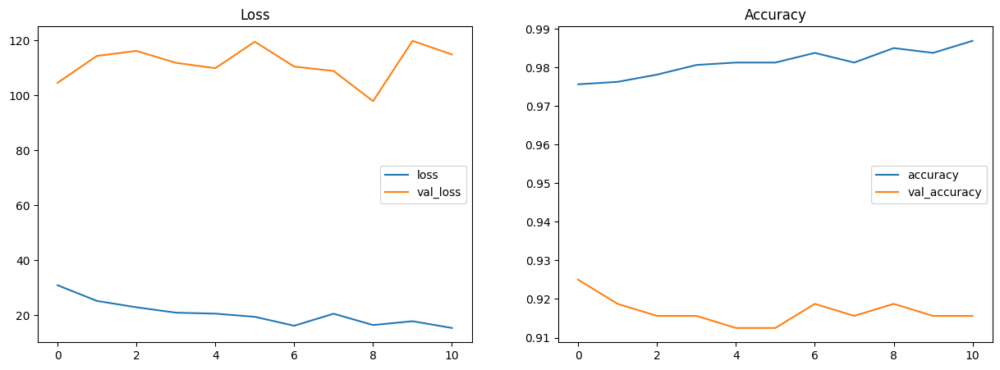

11/11 [==============================] - 1s 48ms/step - loss: 120.8947 - accuracy: 0.9014
Evaluation results: [loss, accuracy] [120.89472198486328, 0.9014492630958557]


In [ ]:
# Evaluate and Save model
evaluate_save_model(model,training_results,test_data,execution_time, learning_rate, batch_size, epochs, optimizer)

## **Display predictions**

11/11 [==============================] - 4s 46ms/step


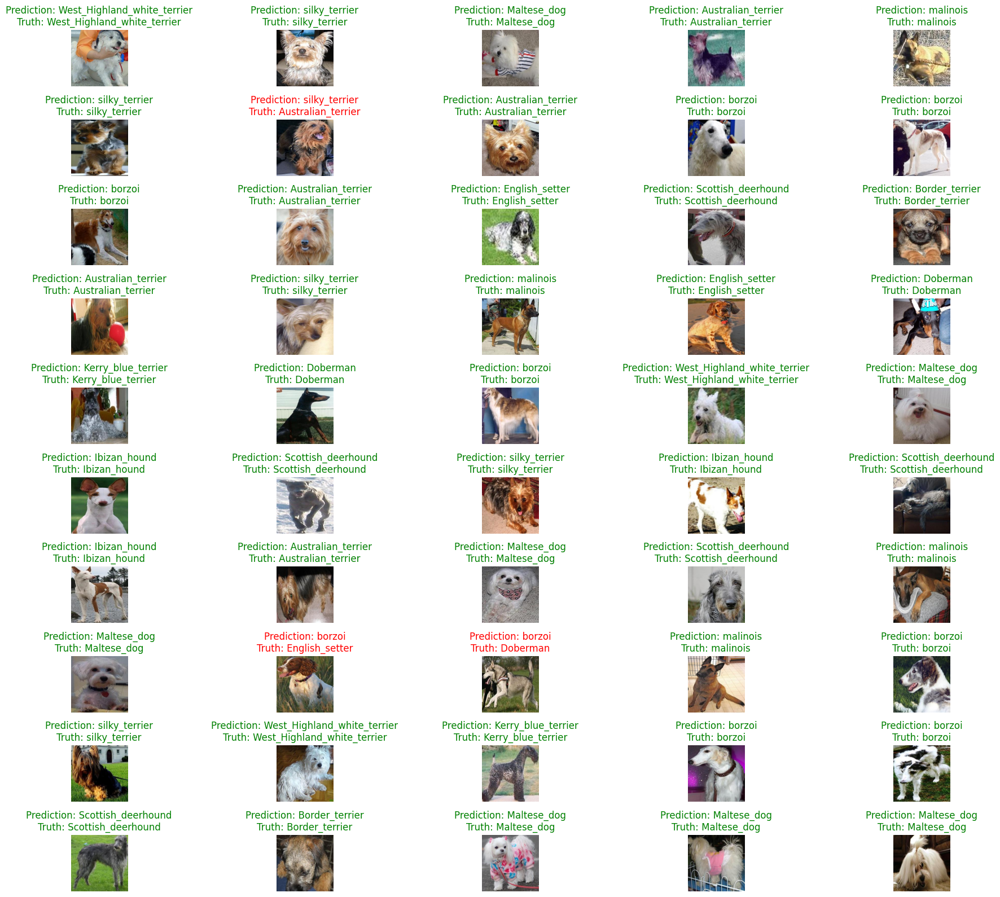

# of true predictions:  47
# of false predictions:  3


In [ ]:
# load best model with best weights
prediction_model = tf.keras.models.load_model('/kaggle/working/SavedModels/InceptionResNetV2_DataAug.hdf5')
checkpoint_path = '/kaggle/working/Checkpoints/checkpoint_InceptionResNetV2DataAug.weights.h5'
prediction_model.load_weights(checkpoint_path)

# make predictions
test_predictions = prediction_model.predict(test_data)

# Load Test images
test_x_display = []
target_size = (224, 224)
for path in test_x:
    # read image
    image = cv2.imread(path)
    # convert to rgb
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # resize image
    image = cv2.resize(image, target_size)
    # Train x
    test_x_display.append(image)

# Convert to numpy array
test_x_display = np.asarray(test_x_display)

# add true and predicted breed for each dog image
# mark it green if prediction is true, otherwise red
# count the total number of true predictions for the first 100 images
true_predict = 0
false_predict = 0
fig = plt.figure(figsize=(20,16))
for i,file in enumerate(test_x_display[:50]):
    axs = fig.add_subplot(10,5,i+1)
    axs.set_aspect('equal')
    predicted_breed = index2label[test_predictions.argmax(axis=1)[i]][10:] # [10:] truncates leading unnecessary letters
    true_breed = test_y[i][10:]
    # color code true/false predictions
    if true_breed == predicted_breed:
      axs.set_title('Prediction: ' + predicted_breed + '\n' + 'Truth: ' + true_breed,color='green')
      true_predict += 1
    else:
      axs.set_title('Prediction: ' + predicted_breed + '\n' + 'Truth: ' + true_breed,color='red')
      false_predict += 1
    plt.imshow(test_x_display[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

print('# of true predictions: ', true_predict)
print('# of false predictions: ', false_predict)

## **Evaluate model**

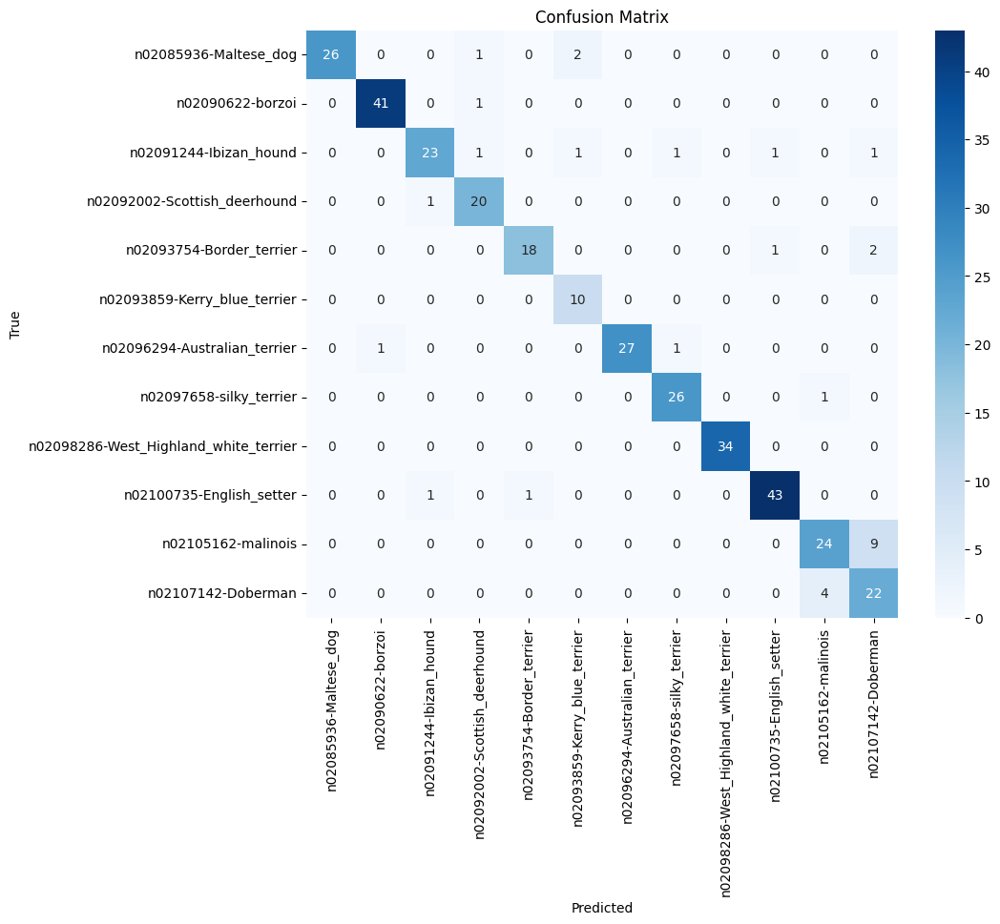

                                       precision    recall  f1-score
n02085936-Maltese_dog                   1.000000  0.896552  0.945455
n02090622-borzoi                        0.976190  0.976190  0.976190
n02091244-Ibizan_hound                  0.920000  0.821429  0.867925
n02092002-Scottish_deerhound            0.869565  0.952381  0.909091
n02093754-Border_terrier                0.947368  0.857143  0.900000
n02093859-Kerry_blue_terrier            0.769231  1.000000  0.869565
n02096294-Australian_terrier            1.000000  0.931034  0.964286
n02097658-silky_terrier                 0.928571  0.962963  0.945455
n02098286-West_Highland_white_terrier   1.000000  1.000000  1.000000
n02100735-English_setter                0.955556  0.955556  0.955556
n02105162-malinois                      0.827586  0.727273  0.774194
n02107142-Doberman                      0.647059  0.846154  0.733333
accuracy                                0.910145  0.910145  0.910145
macro avg                         

In [ ]:
# Convert predictions to class labels
predicted_labels = np.argmax(test_predictions, axis=1)
true_labels = np.argmax(test_processed_y, axis=1)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Visualize the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=sorted(label2index.keys()), yticklabels=sorted(label2index.keys()))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=sorted(label2index.keys()), output_dict=True)

# Convert report to DataFrame for better visualization
report_df = pd.DataFrame(report).transpose()

# Display the table with accuracy, precision, recall, and F1-score
print(report_df[['precision', 'recall', 'f1-score']])

# **DenseNet201**

## **Build model**

In [ ]:
densenet201 = DenseNet201(
    input_shape=(128, 128, 3),
    include_top=False,
    weights='imagenet')

74836368/74836368 [==============================] - 0s 0us/step


In [ ]:
def build_densenet201_model(model_name='DenseNet201', print_summary=True):
    # Load pre-trained DenseNet201 model
    densenet201 = DenseNet201(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

    # Set all layers as non-trainable
    for layer in densenet201.layers:
        layer.trainable = False

    # Input
    model_input = densenet201.input

    # Extract final pool layer
    hidden = densenet201.layers[-1]

    # Flatten
    hidden = layers.Flatten()(hidden.output)

    # Output Layer
    output = layers.Dense(units=12, activation='softmax')(hidden)

    # Create model
    model = Model(model_input, output, name=model_name)

    # Print the model architecture
    if print_summary:
        print(model.summary())

    return model

## **Training params**

In [ ]:
############################
# Training Params
############################
batch_size = 32
epochs = 50
############################

# Early Stopping
earlystopping = EarlyStopping(monitor='val_accuracy', patience=10);

# Model Checkpoint
checkpoint_filepath = '/kaggle/working/Checkpoints/checkpoint_DenseNet201.weights.h5'
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    verbose=1,
    mode='max',
    save_best_only=True)

# Build the model
model = build_densenet201_model()

# Optimier
optimizer = optimizers.Adam()

# Loss
loss = losses.categorical_crossentropy

# Compile
model.compile(loss=loss,
                  optimizer=optimizer,
                  metrics=['accuracy'])

Model: "DenseNet201"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 zero_padding2d_2 (ZeroPadd  (None, 134, 134, 3)          0         ['input_7[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 64, 64, 64)           9408      ['zero_padding2d_2[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 64, 64, 64)           256       ['conv1/conv[0][0]']

## **Train model**

In [ ]:
# Train model
start_time = time.time()
training_results = model.fit(
        train_data,
        validation_data=validation_data,
        epochs=epochs,
        callbacks=[earlystopping,model_checkpoint_callback],
        verbose=1,
        steps_per_epoch=steps_per_epoch,
        validation_steps=validation_steps)
execution_time = (time.time() - start_time)/60.0
print("Training execution time (mins)",execution_time)

Epoch 1/50
49/50 [============================>.] - ETA: 0s - loss: 1.8713 - accuracy: 0.7800
Epoch 1: val_accuracy improved from -inf to 0.89062, saving model to /kaggle/working/Checkpoints/checkpoint_DenseNet201.weights.h5
50/50 [==============================] - 23s 168ms/step - loss: 1.8342 - accuracy: 0.7844 - val_loss: 0.9161 - val_accuracy: 0.8906
Epoch 2/50
50/50 [==============================] - ETA: 0s - loss: 0.3608 - accuracy: 0.9463
Epoch 2: val_accuracy improved from 0.89062 to 0.93125, saving model to /kaggle/working/Checkpoints/checkpoint_DenseNet201.weights.h5
50/50 [==============================] - 5s 103ms/step - loss: 0.3608 - accuracy: 0.9463 - val_loss: 0.6246 - val_accuracy: 0.9312
Epoch 3/50
50/50 [==============================] - ETA: 0s - loss: 0.0863 - accuracy: 0.9781
Epoch 3: val_accuracy did not improve from 0.93125
50/50 [==============================] - 3s 59ms/step - loss: 0.0863 - accuracy: 0.9781 - val_loss: 0.8818 - val_accuracy: 0.9000
Epoch 4/5

## **Save model**

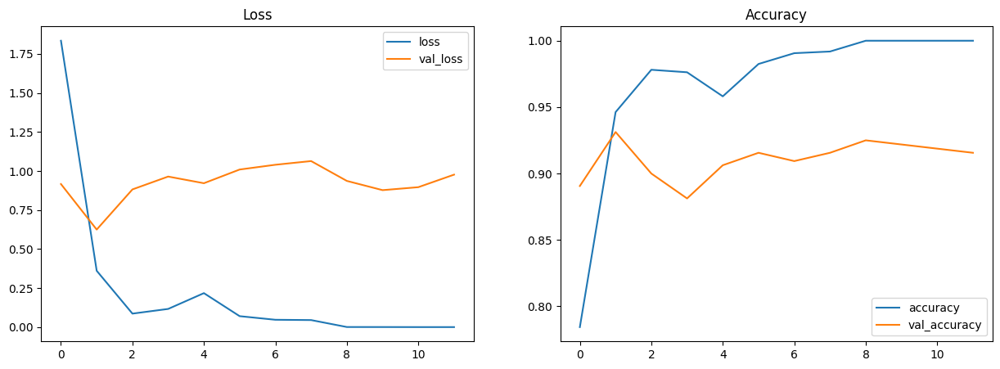

11/11 [==============================] - 4s 430ms/step - loss: 0.8361 - accuracy: 0.9246
Evaluation results: [loss, accuracy] [0.8361032009124756, 0.9246376752853394]


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Save model
learning_rate = 0.001;
evaluate_save_model(model,training_results,test_data,execution_time, learning_rate, batch_size, epochs, optimizer)

## **Add data augmentation to DenseNet201**



In [ ]:
# Create data augmentation processors

# https://www.tensorflow.org/api_docs/python/tf/image/adjust_brightness
def adjust_brightness(image, label):
    return tf.image.adjust_brightness(image, 0.01), label

# https://www.tensorflow.org/api_docs/python/tf/image/adjust_contrast
def adjust_contrast(image, label):
    return tf.image.adjust_contrast(image, 1.2), label

# Apply data processing + data augmentation steps
data_process_list=[load_image, normalize, adjust_brightness, adjust_contrast]

# Build data generators for train, validate, test
train_data, validation_data, test_data = build_data_generators(train_data_process_list=data_process_list)
print("train_data",train_data)
print("validation_data",validation_data)
print("test_data",test_data)

train_data <_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 12), dtype=tf.float32, name=None))>
validation_data <_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 12), dtype=tf.float32, name=None))>
test_data <_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 12), dtype=tf.float32, name=None))>


## **Build model**

In [ ]:
############################
# Training Params
############################
batch_size = 32
epochs = 50
############################

# Early Stopping
earlystopping = EarlyStopping(monitor='val_accuracy', patience=10);

# Model Checkpoint
checkpoint_filepath = '/kaggle/working/Checkpoints/checkpoint_DenseNet201DataAug.weights.h5'
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    verbose=1,
    mode='max',
    save_best_only=True)

# Build the model
model = build_densenet201_model(model_name='DenseNet201_DataAug')

# Loads the weights
checkpoint_path = '/kaggle/working/Checkpoints/checkpoint_DenseNet201.weights.h5'
model.load_weights(checkpoint_path)

# Optimier
optimizer = optimizers.Adam()

# Loss
loss = losses.categorical_crossentropy

# Compile
model.compile(loss=loss,
                  optimizer=optimizer,
                  metrics=['accuracy'])

Model: "DenseNet201_DataAug"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_9 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 zero_padding2d_6 (ZeroPadd  (None, 134, 134, 3)          0         ['input_9[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 64, 64, 64)           9408      ['zero_padding2d_6[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 64, 64, 64)           256       ['conv1/conv

## **Train model**

In [ ]:
# Train model
start_time = time.time()
training_results = model.fit(
        train_data,
        validation_data=validation_data,
        epochs=epochs,
        callbacks=[earlystopping,model_checkpoint_callback],
        verbose=1,
        steps_per_epoch=steps_per_epoch,
        validation_steps=validation_steps)
execution_time = (time.time() - start_time)/60.0
print("Training execution time (mins)",execution_time)

Epoch 1/50
49/50 [============================>.] - ETA: 0s - loss: 0.4035 - accuracy: 0.9413
Epoch 1: val_accuracy improved from -inf to 0.88125, saving model to /kaggle/working/Checkpoints/checkpoint_DenseNet201DataAug.weights.h5
50/50 [==============================] - 19s 189ms/step - loss: 0.4056 - accuracy: 0.9406 - val_loss: 1.5848 - val_accuracy: 0.8813
Epoch 2/50
50/50 [==============================] - ETA: 0s - loss: 0.3537 - accuracy: 0.9613
Epoch 2: val_accuracy did not improve from 0.88125
50/50 [==============================] - 3s 61ms/step - loss: 0.3537 - accuracy: 0.9613 - val_loss: 2.3298 - val_accuracy: 0.8562
Epoch 3/50
49/50 [============================>.] - ETA: 0s - loss: 0.3627 - accuracy: 0.9605
Epoch 3: val_accuracy did not improve from 0.88125
50/50 [==============================] - 3s 60ms/step - loss: 0.3590 - accuracy: 0.9600 - val_loss: 1.8501 - val_accuracy: 0.8781
Epoch 4/50
50/50 [==============================] - ETA: 0s - loss: 0.0664 - accuracy:

## **Save model**

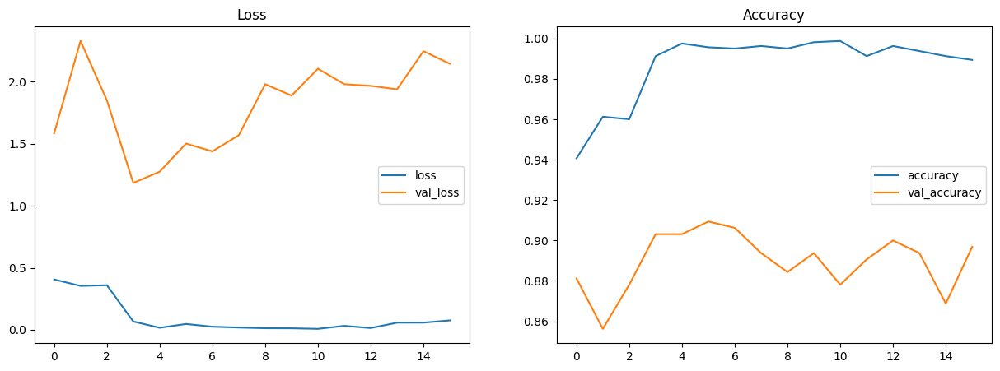

11/11 [==============================] - 1s 46ms/step - loss: 1.7676 - accuracy: 0.9101
Evaluation results: [loss, accuracy] [1.7676417827606201, 0.9101449251174927]


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Evaluate and Save model
evaluate_save_model(model,training_results,test_data,execution_time, learning_rate, batch_size, epochs, optimizer)

## **Display predictions**

11/11 [==============================] - 4s 45ms/step


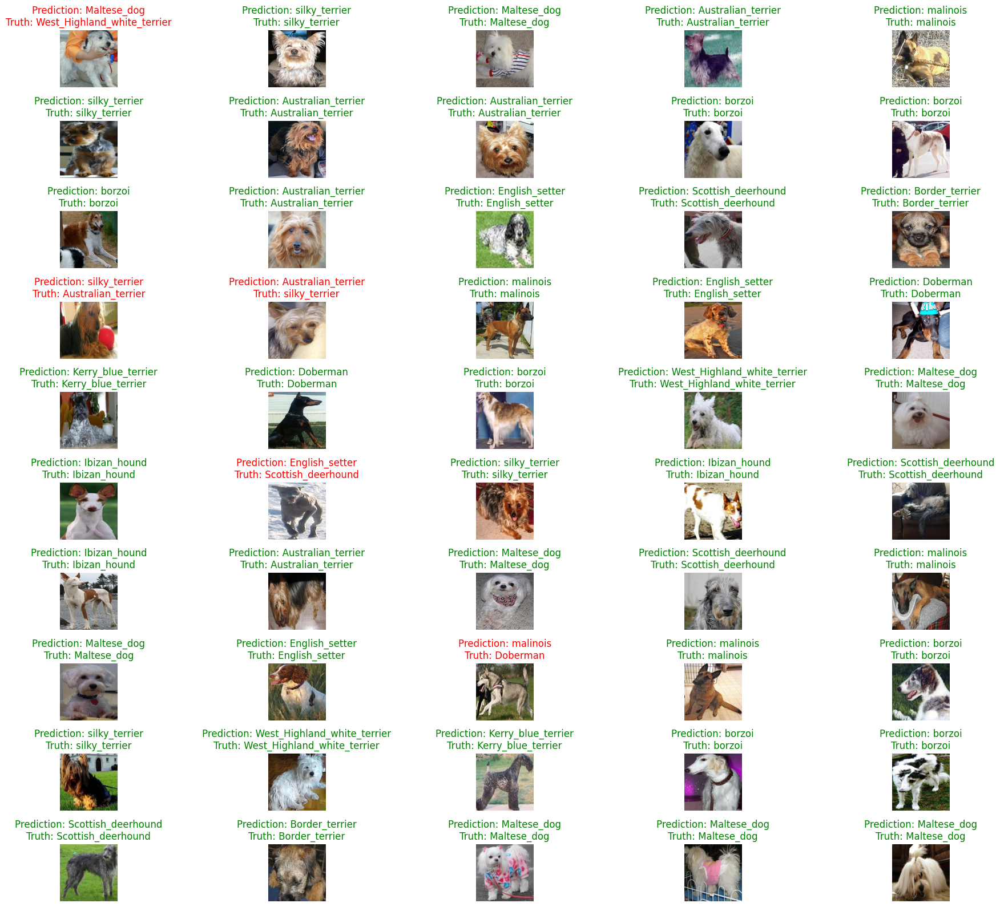

# of true predictions:  45
# of false predictions:  5


In [ ]:
# load best model with best weights
prediction_model = tf.keras.models.load_model('/kaggle/working/SavedModels/DenseNet201_DataAug.hdf5')
checkpoint_path = '/kaggle/working/Checkpoints/checkpoint_DenseNet201DataAug.weights.h5'
prediction_model.load_weights(checkpoint_path)

# make predictions
test_predictions = prediction_model.predict(test_data)

# Load Test images
test_x_display = []
target_size = (224, 224)
for path in test_x:
    # read image
    image = cv2.imread(path)
    # convert to rgb
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # resize image
    image = cv2.resize(image, target_size)
    # Train x
    test_x_display.append(image)

# Convert to numpy array
test_x_display = np.asarray(test_x_display)

# add true and predicted breed for each dog image
# mark it green if prediction is true, otherwise red
# count the total number of true predictions for the first 100 images
true_predict = 0
false_predict = 0
fig = plt.figure(figsize=(20,16))
for i,file in enumerate(test_x_display[:50]):
    axs = fig.add_subplot(10,5,i+1)
    axs.set_aspect('equal')
    predicted_breed = index2label[test_predictions.argmax(axis=1)[i]][10:] # [10:] truncates leading unnecessary letters
    true_breed = test_y[i][10:]
    # color code true/false predictions
    if true_breed == predicted_breed:
      axs.set_title('Prediction: ' + predicted_breed + '\n' + 'Truth: ' + true_breed,color='green')
      true_predict += 1
    else:
      axs.set_title('Prediction: ' + predicted_breed + '\n' + 'Truth: ' + true_breed,color='red')
      false_predict += 1
    plt.imshow(test_x_display[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

print('# of true predictions: ', true_predict)
print('# of false predictions: ', false_predict)

## **Evaluate model**

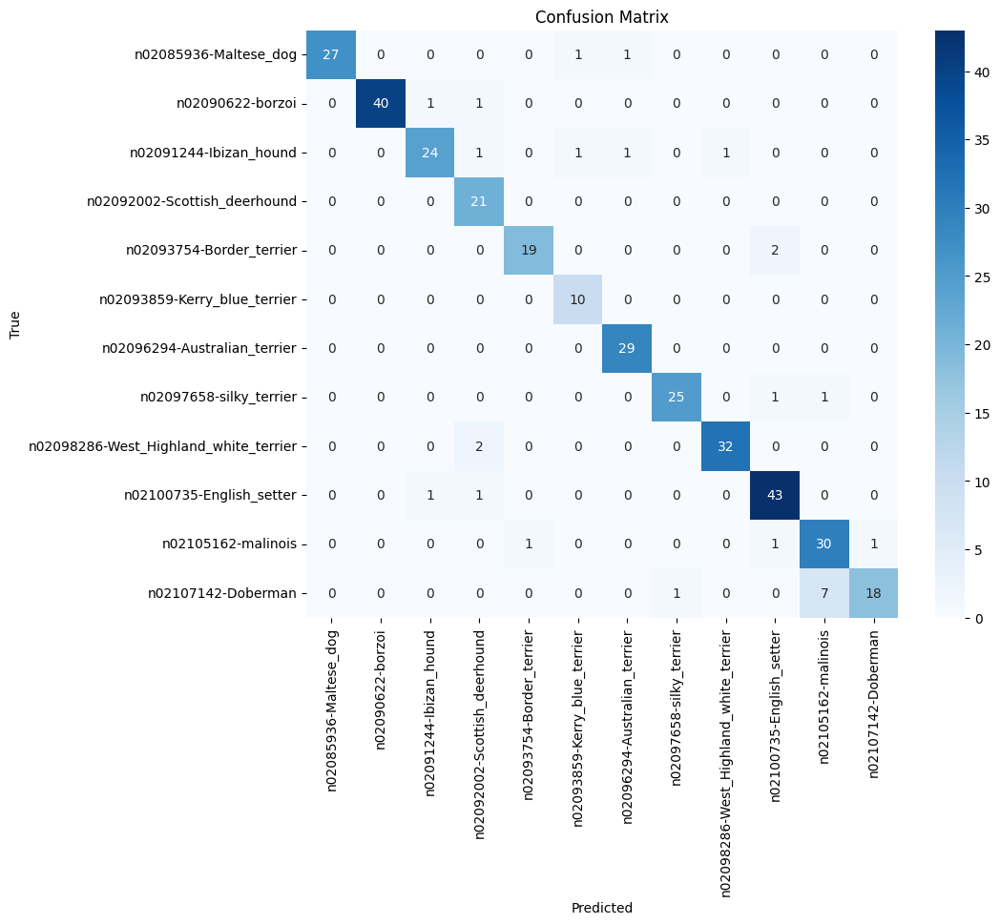

                                       precision    recall  f1-score
n02085936-Maltese_dog                   1.000000  0.931034  0.964286
n02090622-borzoi                        1.000000  0.952381  0.975610
n02091244-Ibizan_hound                  0.923077  0.857143  0.888889
n02092002-Scottish_deerhound            0.807692  1.000000  0.893617
n02093754-Border_terrier                0.950000  0.904762  0.926829
n02093859-Kerry_blue_terrier            0.833333  1.000000  0.909091
n02096294-Australian_terrier            0.935484  1.000000  0.966667
n02097658-silky_terrier                 0.961538  0.925926  0.943396
n02098286-West_Highland_white_terrier   0.969697  0.941176  0.955224
n02100735-English_setter                0.914894  0.955556  0.934783
n02105162-malinois                      0.789474  0.909091  0.845070
n02107142-Doberman                      0.947368  0.692308  0.800000
accuracy                                0.921739  0.921739  0.921739
macro avg                         

In [ ]:
# Convert predictions to class labels
predicted_labels = np.argmax(test_predictions, axis=1)
true_labels = np.argmax(test_processed_y, axis=1)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Visualize the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=sorted(label2index.keys()), yticklabels=sorted(label2index.keys()))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=sorted(label2index.keys()), output_dict=True)

# Convert report to DataFrame for better visualization
report_df = pd.DataFrame(report).transpose()

# Display the table with accuracy, precision, recall, and F1-score
print(report_df[['precision', 'recall', 'f1-score']])

# **Compare all models**

In [ ]:
# Read the model metrics from a JSON file
view_metrics = pd.read_json("/kaggle/working/SavedModels/model_metrics.json")

# Transpose the DataFrame to swap the rows and columns
view_metrics = view_metrics.T

# Convert the accuracy to percentage format
view_metrics['accuracy'] = view_metrics['accuracy']*100
view_metrics['accuracy'] = view_metrics['accuracy'].map('{:,.2f}%'.format)

# Format the trainable parameters as integers
view_metrics['trainable_parameters'] = view_metrics['trainable_parameters'].map('{:,.0f}'.format)

# Format the execution time as minutes
view_metrics['execution_time'] = view_metrics['execution_time'].map('{:,.2f} mins'.format)

# Convert the model size to MB and format it as integers
view_metrics['model_size'] = view_metrics['model_size']/1000000
view_metrics['model_size'] = view_metrics['model_size'].map('{:,.0f} MB'.format)

# Print the number of models
print('Number of models:',view_metrics.shape[0])

Number of models: 7


In [ ]:
view_metrics.sort_values(by=['accuracy'],ascending=False).head(10)

,trainable_parameters,execution_time,loss,accuracy,model_size,learning_rate,batch_size,momentum,epochs,optimizer
ResNet152V2,"58,724,876",1.09 mins,2.788441,92.75%,240 MB,0.001,32,None,50,Adam
DenseNet201,"18,690,636",0.98 mins,0.836103,92.46%,80 MB,0.001,32,None,50,Adam
DenseNet201_DataAug,"18,690,636",1.16 mins,1.767642,91.01%,80 MB,0.001,32,None,50,Adam
ResNet152V2_DataAug,"58,724,876",2.68 mins,3.77102,90.72%,240 MB,0.001,32,None,50,Adam
InceptionResNetV2,"54,410,476",1.28 mins,154.17128,90.72%,220 MB,0.001,32,None,50,SGD
InceptionResNetV2_DataAug,"54,410,476",0.84 mins,120.894722,90.14%,220 MB,0.001,32,None,50,Adam
VGG19,"29,475,916",0.85 mins,2.319671,68.99%,184 MB,0.001,32,None,50,SGD
